## Install dependencies

In [2]:
TRAINING = True

if TRAINING:
    !git clone https://github.com/ultralytics/yolov5  # clone repo
    !pip install -qr yolov5/requirements.txt  # install dependencies (ignore errors)
    !pip install -U pyyaml  # outdated in requirements
    
import torch
from IPython.display import Image, display, clear_output  # to display images
%cd yolov5

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.6.0+cu101 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


## Configure model architecture

In [22]:
# configured YAML file with data path and number of classes
%cat ../data.yaml

train: ../../data/train/images/
val: ../../data/val/images/
test: ../../data/test/images/

nc: 8
names: ['biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-Red', 'trafficLight-Yellow', 'truck']

In [23]:
import yaml

# define number of classes
with open("../data.yaml", "r") as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])
print(num_classes)

8


In [24]:
# YAML model configuration
%cat models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-

In [25]:
# customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [26]:
%%writetemplate models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

## Train YOLOv5 model

Here, we are able to pass a number of arguments:
* <b>img</b>: define input image size
* <b>batch</b>: determine batch size
* <b>epochs</b>: define the number of training epochs
* <b>data</b>: set the path to our yaml file
* <b>cfg</b>: specify our model configuration
* <b>weights</b>: specify a custom path to weights
* <b>name</b>: result names
* <b>nosave</b>: only save the final checkpoint
* <b>cache</b>: cache images for faster training


In [21]:
import os

train_path = '../../data/train/'
val_path = '../../data/val/'
print(len(set(os.listdir(train_path + 'images'))), len(set(os.listdir(train_path + 'labels'))))
print(len(os.listdir(val_path + 'images')), len(os.listdir(val_path + 'labels')))

12246 12246
662 662


In [ ]:
# train yolov5s on custom data for 1500 epochs
# time its performance
%%time
if TRAINING:
    !python train.py --img 512 --batch 16 --epochs 1500 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

Resuming training from ./runs/exp3_yolov5s_results/weights_backup_epoch1361/last.pt
Using CUDA device0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', total_memory=16280MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='', data='../data.yaml', device='', epochs=1500, evolve=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[512, 512], local_rank=-1, logdir='runs/', multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, rect=False, resume=True, single_cls=False, sync_bn=False, total_batch_size=16, weights='./runs/exp3_yolov5s_results/weights_backup_epoch1361/last.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
2020-10-28 19:40:40.261369: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Hyperparameters {'lr0': 0.01, 'lrf': 0.2, 'momentum': 0.937, 'weight_decay

## Evaluate YOLOv5 performance

In [9]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

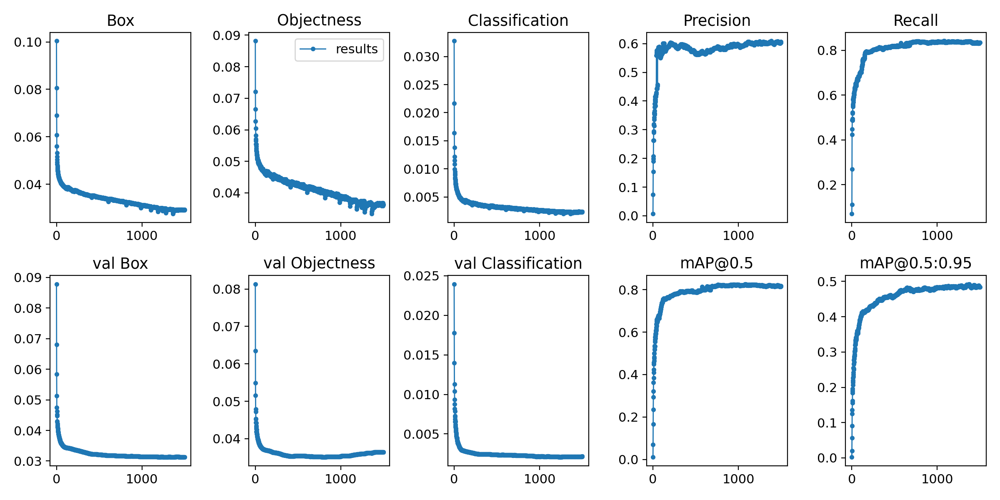

In [13]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason
Image(filename='./runs/exp0_yolov5s_results/results.png', width=1000)

## Visualise training data with labels

AUGMENTED TRAINING DATA:


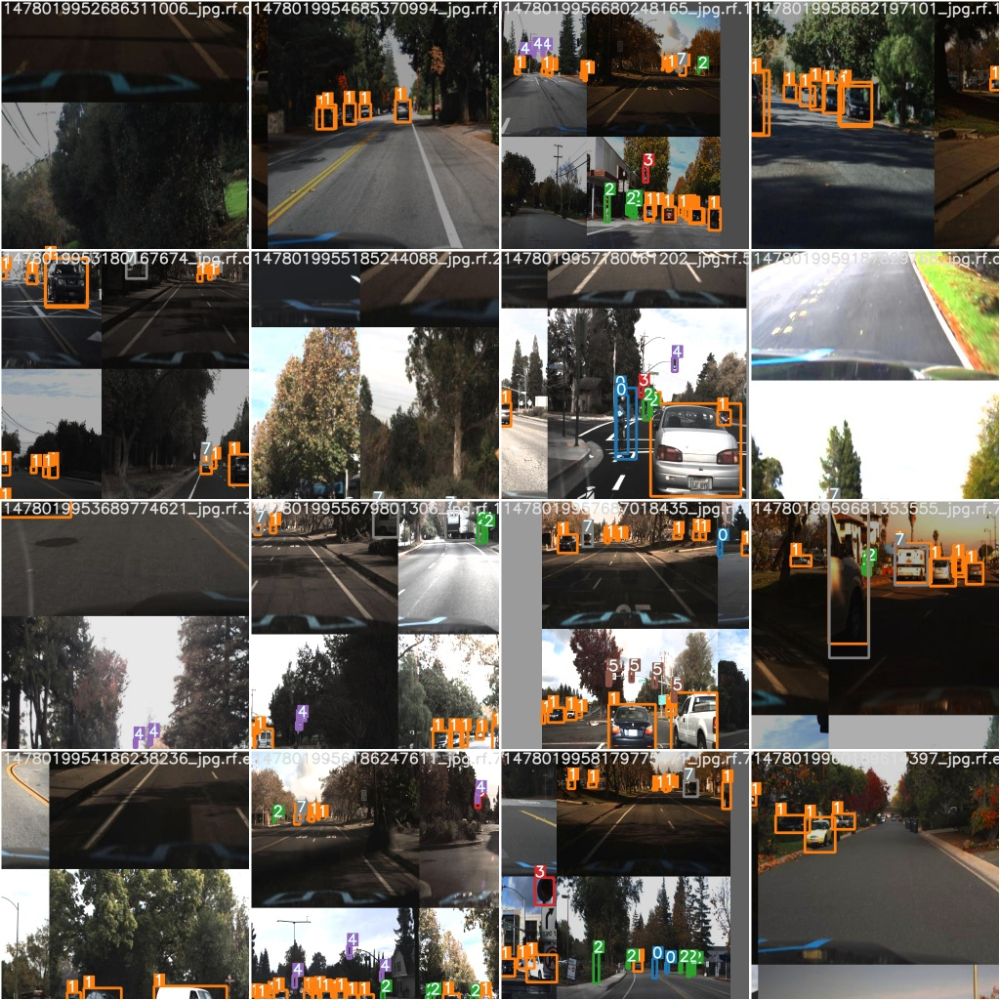

In [14]:
print("AUGMENTED TRAINING DATA:")
Image(filename='./runs/exp0_yolov5s_results/train_batch0.jpg', width=900)

AUGMENTED TRAINING DATA:


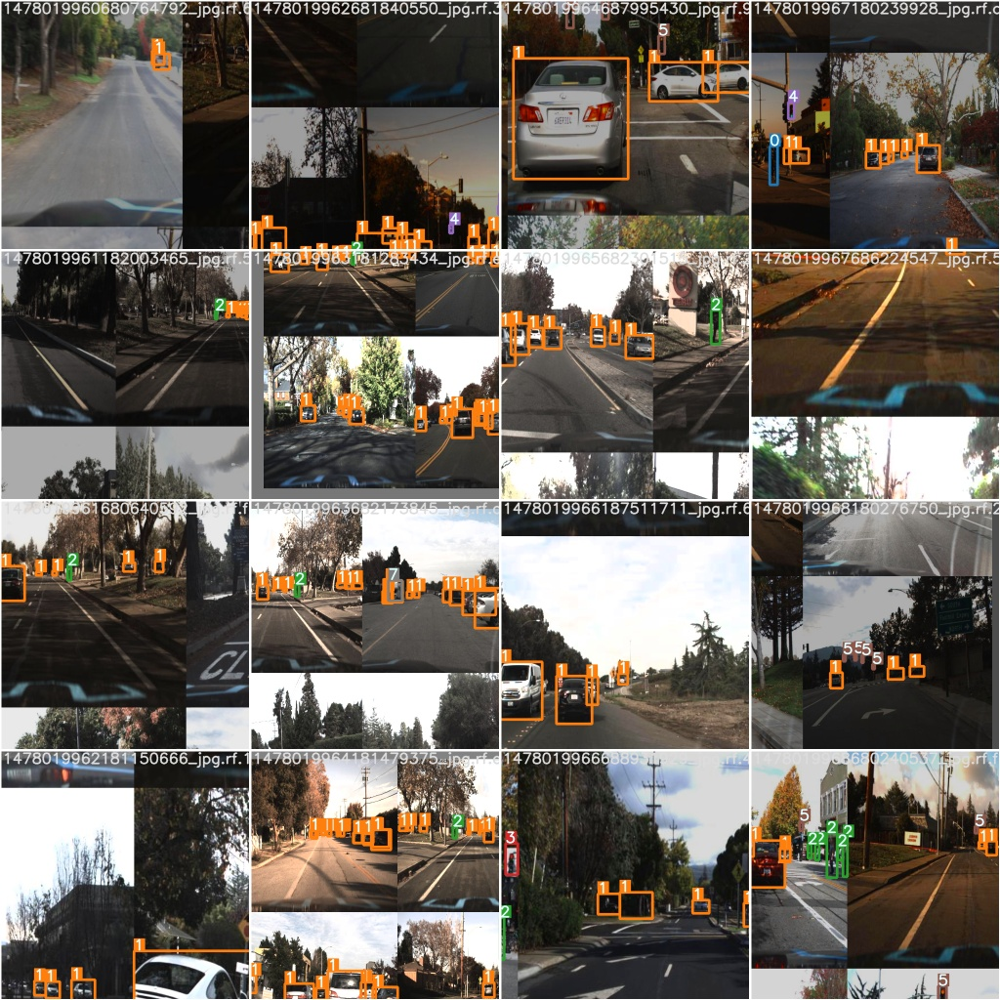

In [15]:
print("AUGMENTED TRAINING DATA:")
Image(filename='./runs/exp0_yolov5s_results/train_batch1.jpg', width=900)

AUGMENTED TRAINING DATA:


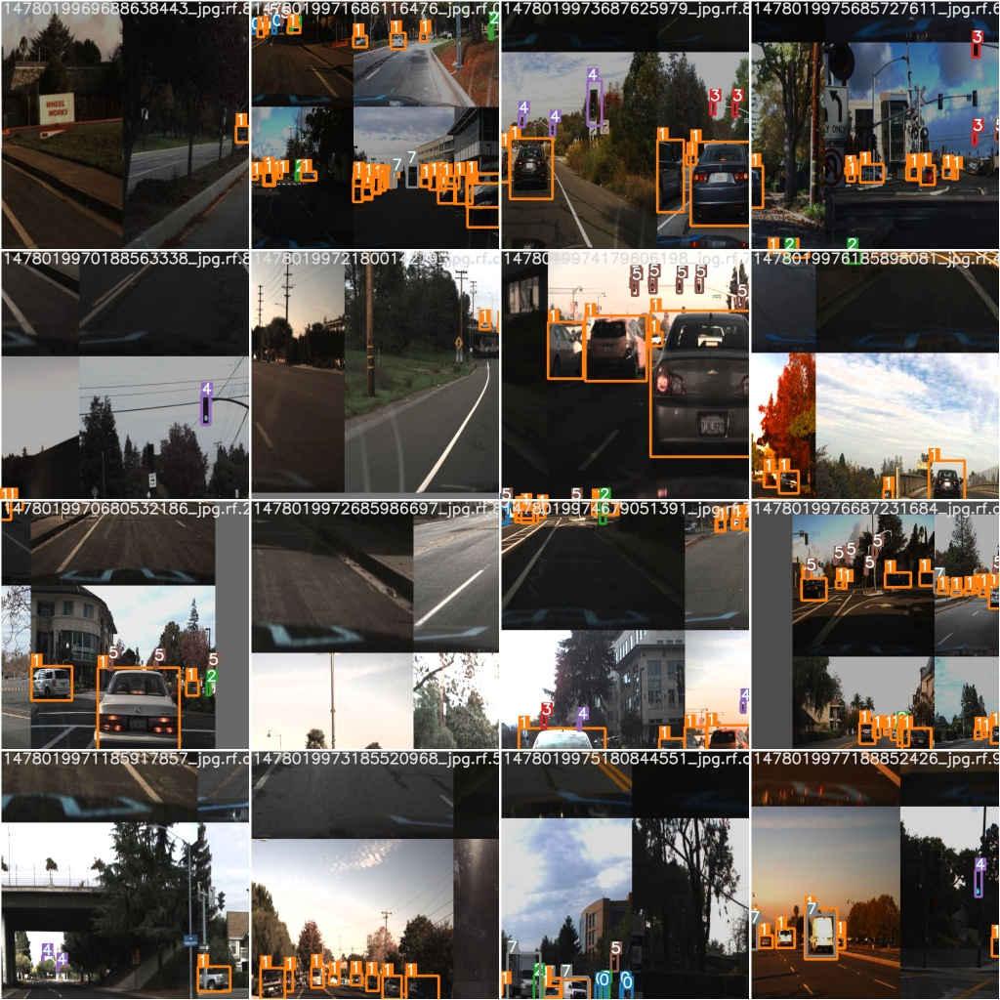

In [16]:
print("AUGMENTED TRAINING DATA:")
Image(filename='./runs/exp0_yolov5s_results/train_batch2.jpg', width=900)

## Visualise testing data with labels

GROUND TRUTH TESTING DATA:


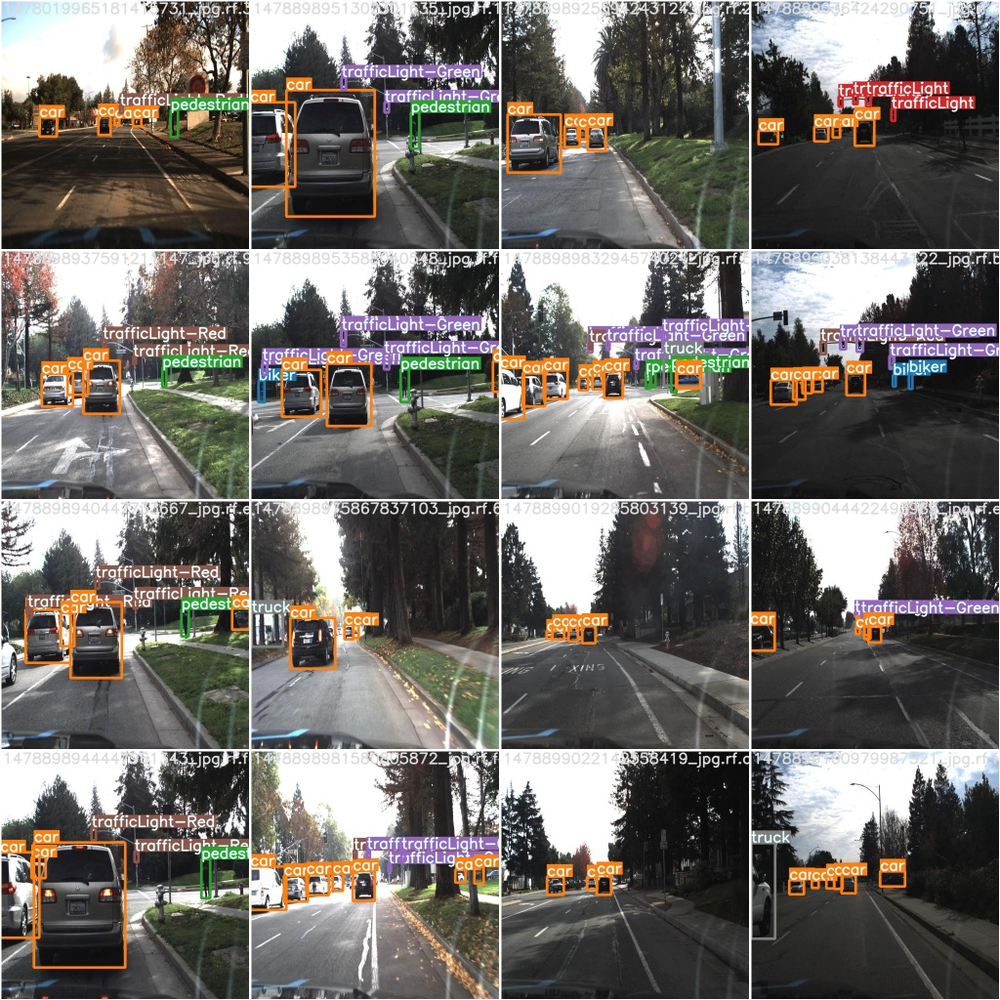

In [17]:
# first, display our ground truth data
print("GROUND TRUTH TESTING DATA:")
Image(filename='./runs/exp0_yolov5s_results/test_batch0_gt.jpg', width=900)

AUGMENTED TESTING DATA PREDICTION:


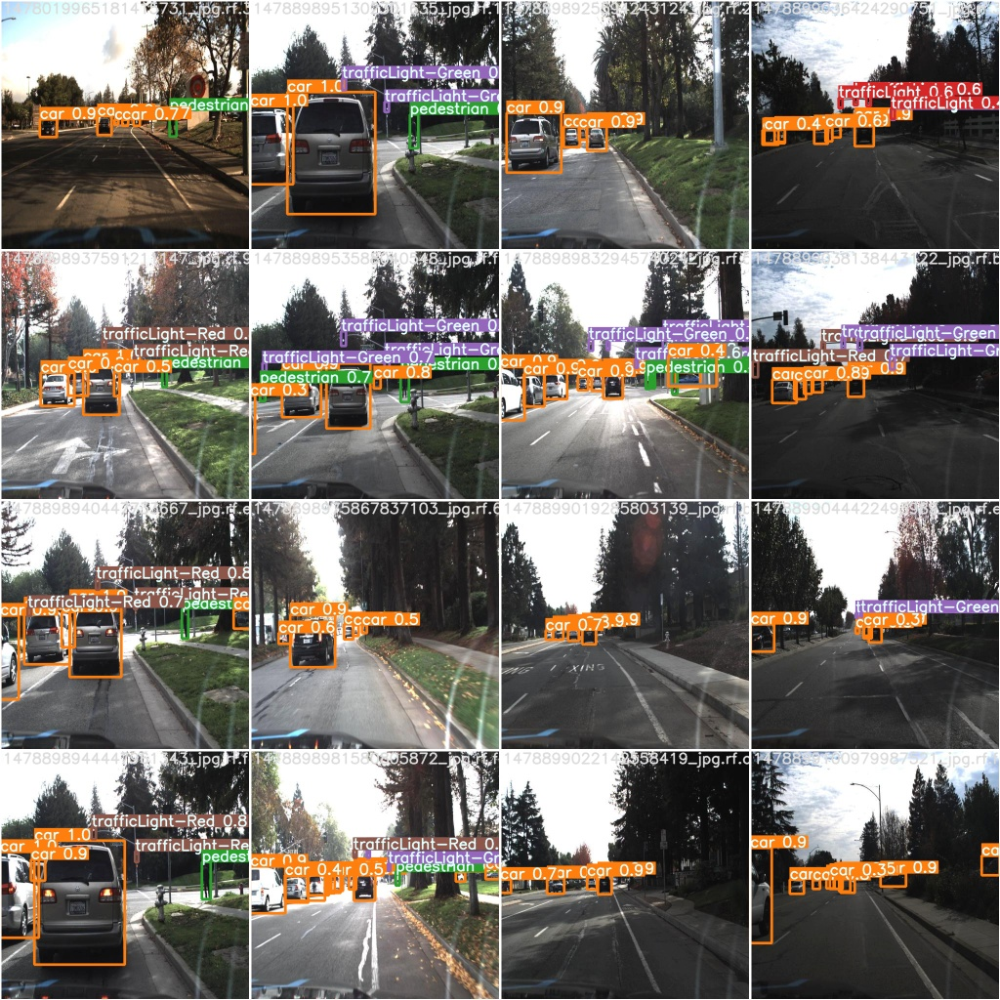

In [18]:
# print out an augmented training example
print("AUGMENTED TESTING DATA PREDICTION:")
Image(filename='./runs/exp0_yolov5s_results/test_batch0_pred.jpg', width=900)

## Run inference with trained weights

In [19]:
%ls runs/exp0_yolov5s_results/weights

best.pt  last.pt


In [44]:
!python detect.py --weights runs/exp0_yolov5s_results/weights/best.pt --img 512 --conf 0.1 --source ../../data/test/images

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.1, device='', img_size=512, iou_thres=0.45, output='inference/output', save_txt=False, source='../test/images', update=False, view_img=False, weights=['runs/exp3_yolov5s_results/weights/best.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', total_memory=16280MB)

Fusing layers... 
Model Summary: 140 layers, 7.2654e+06 parameters, 0 gradients
image 1/331 /content/drive/My Drive/self-driving/test/images/1478020199696886386_jpg.rf.acc534d883f82707467dbf41f3c0f0e6.jpg: 512x512 2 cars, 1 trafficLights, 1 trafficLight-Greens, 2 trafficLight-Reds, Done. (0.032s)
image 2/331 /content/drive/My Drive/self-driving/test/images/1478020213690861968_jpg.rf.96f5643aeb4e604fc6a61e6f7b8d5966.jpg: 512x512 2 cars, 4 trafficLight-Greens, Done. (0.012s)
image 3/331 /content/drive/My Drive/self-driving/test/images/1478020239197694369_jpg.rf.3c25e43049296d4308ed5e13dfc96889.jpg: 512x512 5 cars, 2 trafficLights, 3

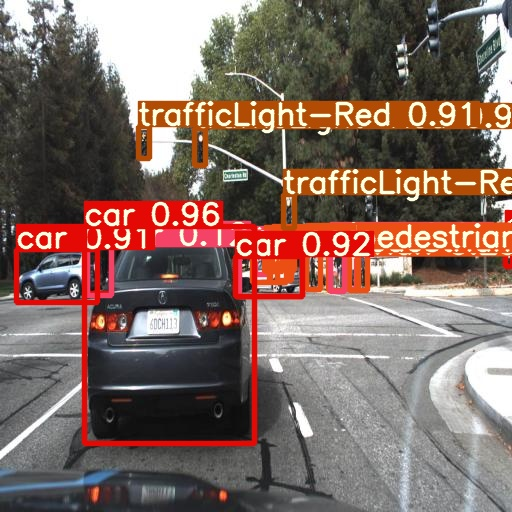

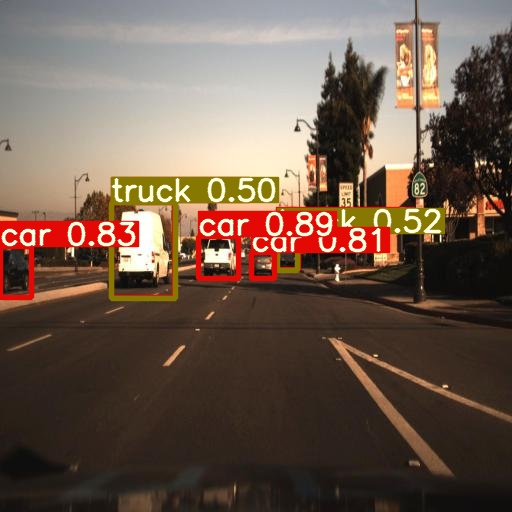

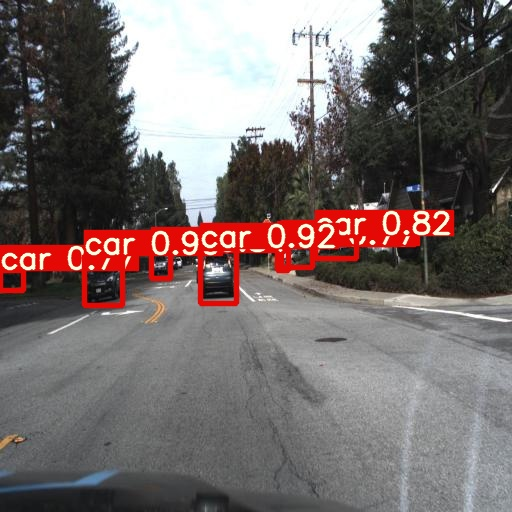

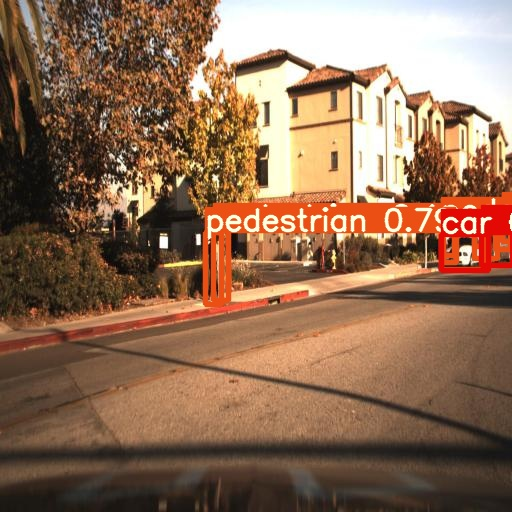

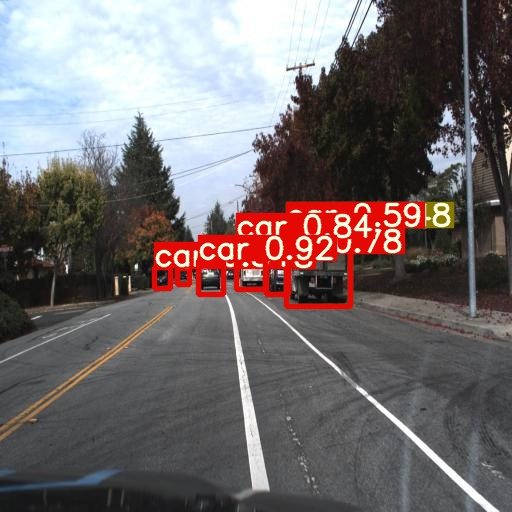

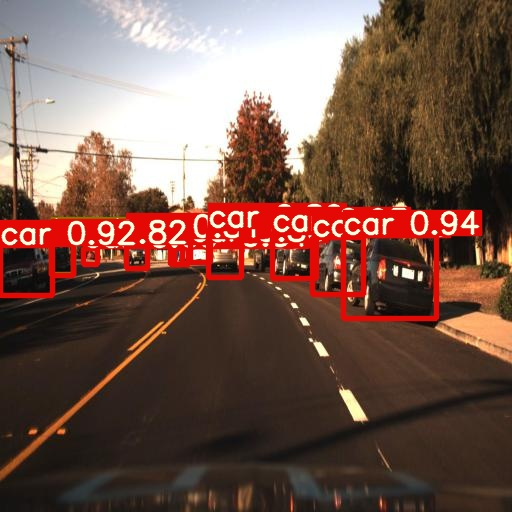

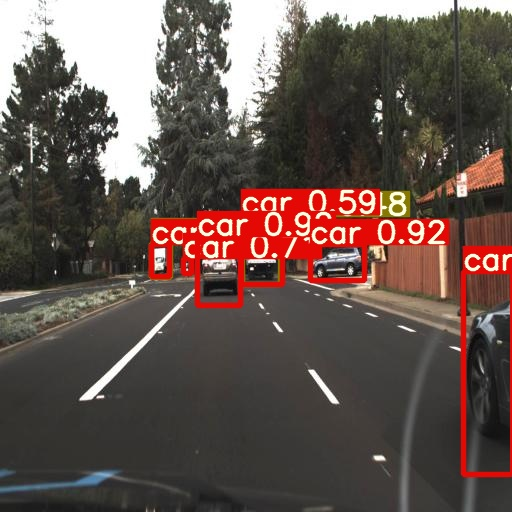

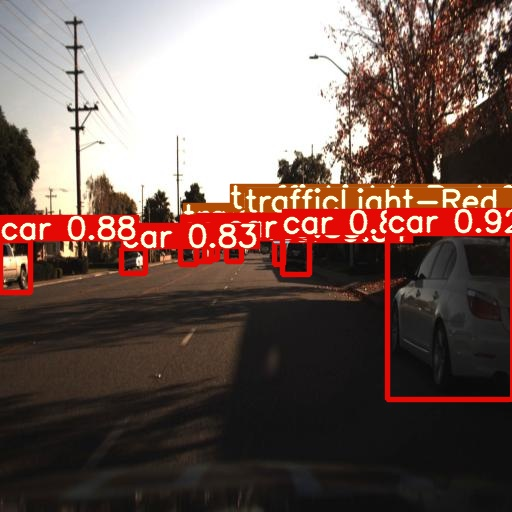

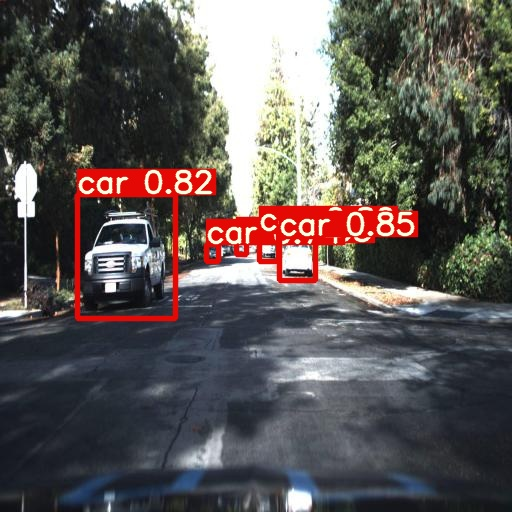

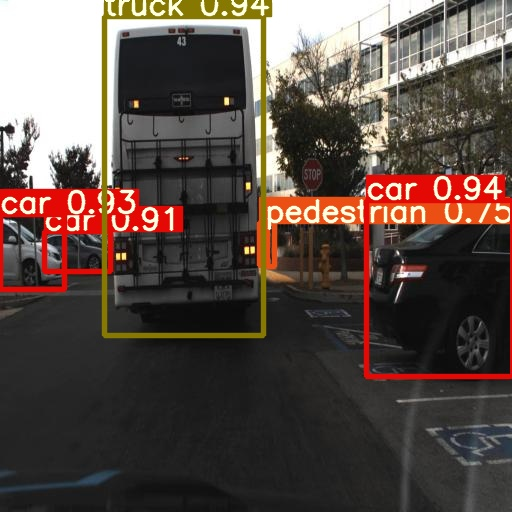

In [22]:
import random
filenames = filenames = ['inference/output/' + file for file in os.listdir('inference/output')]
random.shuffle(filenames)

for imageName in filenames[:10]: 
    display(Image(filename=imageName))
    print("\n")